<a href="https://colab.research.google.com/github/AshwinUnnikrishnan/Solutions/blob/master/%5BYour_Name_Goes_Here%5D_DeepLearningScreenTurtleChallenge_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

*In this challenge you will be asked to build a deep learning solution capable of segmenting turtles on synthetic images. You will be provided with the data, which you can use to train your models; your best model will be used on a test image and you will be asked to implement some geometric algorithms based on the predictions of your model.*

***Training data***

The training data will consist of 30 256x256 images of the same synthetic turtle pasted on background images artificially generated by BigGAN (https://arxiv.org/abs/1809.11096).

Feel free to increase the dataset size as needed and make any relevant changes to the dataset creation.

Each image will come with the ground truth per-pixel segmentation mask which you can leverage for your training setup. We strongly recommend that you treat the provided task as semantic segmentation with 2 classes -- foreground (turtle) and background (everything else).

You are also allowed to use external data sources and pre-trained weights, but please provide justification if you choose to do so.


***Test data***

There will only be a single test image without the provided GT.

The test image differs from the training data and it is up to you to decide how to approach these differences. Notably, the test image is of resolution 512x512 and your predicted mask must be of the same resolution.


***Tasks***

1. Your main task is to build a deep learning model capable of accurately segmenting the turtle in the test image.
2. Based on the segmentation mask predicted by your model, you will need to implement an algorithm that finds a **convex hull** (not concave), i.e. a polygon enclosing all the foreground (i.e. turtle) pixels.
3. Implement an algorithm that calculates the area of the polygon from the result of task 2.

***If you are using third-party code, you have to provide explanation of why you need that code and what that code does. We evaluate your submission based on the code you have written and if there is no such code, we won't be able to evaluate and proceed to the next stage.***

***Rules***

* Please use PyTorch to train your model in task 1.
* Feel free to use all the imported Python libraries
* For tasks 2 and 3 ***you are not allowed*** to use third-party functions that readily solve those tasks, e.g. you are not allowed to use various `cv2` and `scikit-image` operators. We expect the algorithms to be based on points and geometry rather than full-image operations.
* You may modify any provided code, please provide explanation for any significant changes.


***Submission***

* ***You must send us only a single link to the Colab notebook with your solution and nothing else!*** We must be able to reproduce your results by running the notebook in the browser as is. Be careful not to use too much RAM (12G) or GPU (15G) so it does not crash. If you require additional files, use `gdown` to download them into the session storage (see Task 1 for details).
* Include your comments and explanations on the decisions that you made to approach the problem;
* Make sure to include the estimate of approximately how much time it took you to get to the final solution.

***Grading Criteria***

* Output must be correct for all 3 tasks
* Should run in reasonable time without significant inefficiencies. Ideally < 10 minutes, training can take a little longer if needed.
* Code should be clean and readable

***Colab setup***

* To use GPU, go to `Runtime -> Change Runtime Type -> GPU`

In [3]:
# comment the following line if you are working outside of a notebook environment
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image

In [191]:
# Used to download any files you need for your solution from Google Drive
import gdown
gdown.download("https://drive.google.com/uc?id=1ymKI8M73kBIck2b7S7QG02aiP4yXLaML", "turtle.png", quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1ymKI8M73kBIck2b7S7QG02aiP4yXLaML
To: /content/turtle.png
100%|██████████| 692k/692k [00:00<00:00, 119MB/s]


'turtle.png'

In [204]:
# read and visualise the turtle image
turtle_image = Image.open('./turtle.png')
turtle_image_up = Image.open('./turtle_st.png')

# it is a 4-channel RGB+Alpha image of size 2394x1800
print(turtle_image.mode, turtle_image.size)

RGBA (2394, 1800)


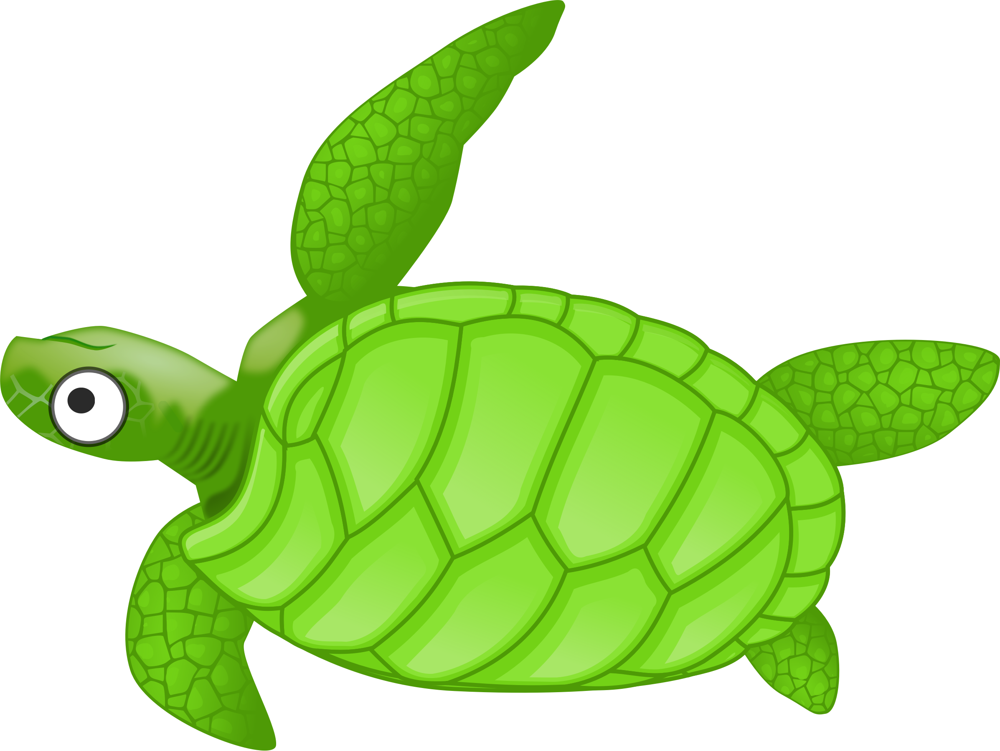

In [195]:
turtle_image_up

In [205]:
# to create the training set, we will resize the turtle image to 256x256
turtle_image_256x256 = turtle_image.resize((256, 256))
turtle_image_256x256_flip = turtle_image_up.resize((256, 256))

# Background Images

As written above, we will use a generative adversarial network called "BigGAN" pre-trained on ImageNet to create a set of background images

In [ ]:
# first, we need to install the python package called `pytorch_pretrained_biggan` (https://github.com/huggingface/pytorch-pretrained-BigGAN)
# if in the notebook environment, please uncomment the following line to install this package
!pip install pytorch_pretrained_biggan
# there might be some errors related to pip's dependency resolver which you can safely ignore

In [9]:
import torch
from pytorch_pretrained_biggan import (
    BigGAN,
    truncated_noise_sample,
    convert_to_images,
    one_hot_from_int,
)

In [10]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
# boilerplate pytorch code enforcing reproducibility
torch.manual_seed(42)
if device.type == "cuda":
    torch.cuda.manual_seed(42)
np.random.seed(42)
random.seed(42)

BigGAN is a memory-intensive network.

To save time and memory, we will only generate 30 different background images.
Feel free to change this setup as needed.

In [11]:
# load the 256x256 model
model = BigGAN.from_pretrained('biggan-deep-256').to(device).eval()

# every time we will run with batch size of 3 in order to not run out of memory
num_passes = 10
batch_size = 3

# default noise value from the provided repository
truncation = 0.4

background_images = []

for _ in range(num_passes):
    # BigGAN uses imagenet and hence each time we will choose one of 1000 categories
    class_vector = torch.from_numpy(
        one_hot_from_int(np.random.randint(0, 1000, size=batch_size), batch_size=batch_size)
    ).to(device)
    noise_vector = torch.from_numpy(
        truncated_noise_sample(truncation=truncation, batch_size=batch_size)
    ).to(device)

    # Generate the images and convert them to PIL image
    with torch.no_grad():
        output = model(noise_vector, class_vector, truncation).cpu()
        background_images.extend(convert_to_images(output))

# We won't need the GAN model anymore,
# so we can safely delete it and free up some memory
del model
torch.cuda.empty_cache()

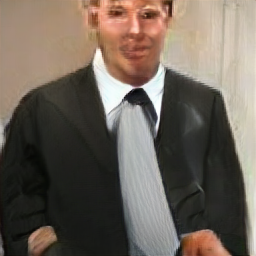

In [12]:
# Let's see how one of the images look like
random.choice(background_images)

# Training Set
Given 30 background images and the turtle image, we will paste the turtle onto the background images.

In [13]:
import torchvision
import torchvision.transforms as transforms

In [14]:
tensor_transform = transforms.ToTensor()

def random_paste(background_image, turtle_image, min_scale=0.25, max_scale=0.65):
    """Randomly scales and pastes the turtle image onto the background image"""

    w, h = turtle_image.size
    # first, we will randomly downscale the turtle image
    new_w = int(random.uniform(min_scale, max_scale) * w)
    new_h = int(random.uniform(min_scale, max_scale) * h)
    resized_turtle_image = turtle_image.resize((new_w, new_h))

    # second, will randomly choose the locations where to paste the new image
    start_w = random.randint(0, w - new_w)
    start_h = random.randint(0, h - new_h)

    # third, will create the blank canvas of the same size as the original image
    canvas_image = Image.new('RGBA', (w, h))

    # and paste the resized turtle onto it, preserving the mask
    canvas_image.paste(resized_turtle_image, (start_w, start_h), resized_turtle_image)

    # Turtle image is of mode RGBA, while background image is of mode RGB;
    # `.paste` requires both of them to be of the same type.
    background_image = background_image.copy().convert('RGBA')
    # finally, will paste the resized turtle onto the background image
    background_image.paste(resized_turtle_image, (start_w, start_h), resized_turtle_image)
    return background_image, canvas_image

In [206]:
training_set = []  # image, segmentation mask

for background_image in background_images:
  # paste the turtle onto background image
  aug_image, aug_mask = random_paste(background_image.copy(), turtle_image_256x256.copy())
  # convert PIL images to pytorch tensors
  training_pair = [
      tensor_transform(aug_image)[:3],  # keep the rgb only
      # For the mask, we only need the last (4th) channel,
      # and we will encode the mask as boolean
      tensor_transform(aug_mask)[-1:] > 0,
  ]
  training_set.append(training_pair)

In [207]:
for background_image in background_images:
  # paste the turtle onto background image
  aug_image, aug_mask = random_paste(background_image.copy(), turtle_image_256x256_flip.copy())
  # convert PIL images to pytorch tensors
  training_pair = [
      tensor_transform(aug_image)[:3],  # keep the rgb only
      # For the mask, we only need the last (4th) channel,
      # and we will encode the mask as boolean
      tensor_transform(aug_mask)[-1:] > 0,
  ]
  training_set.append(training_pair)

In [208]:
len(training_set)

60

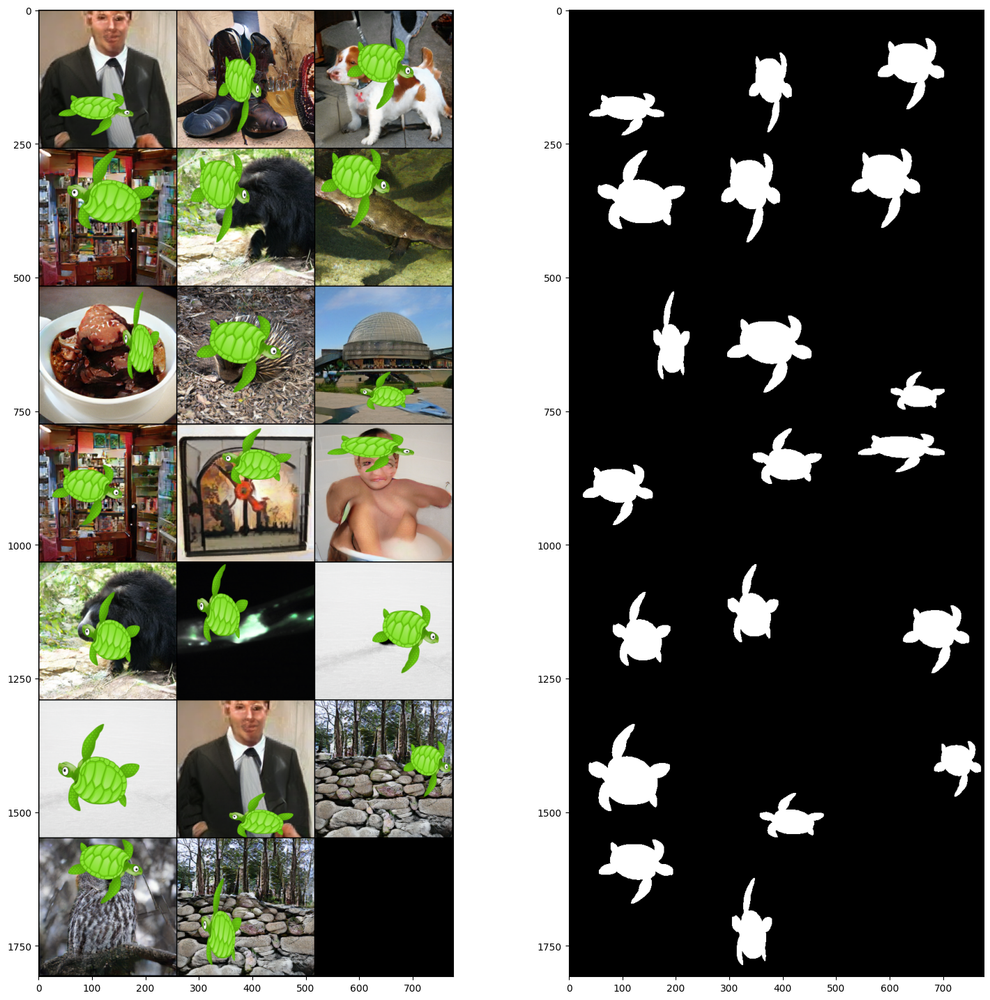

In [209]:
# Let's visualise some subset of the training set
sample_indices = np.random.choice(len(training_set), size=20, replace=False)
sample_images = []
sample_masks = []
for i in sample_indices:
    image, mask = training_set[i]
    sample_images.append(image)
    sample_masks.append(mask)

plt.figure(figsize=(18, 18))
plt.subplot(121)
plt.imshow(torchvision.utils.make_grid(sample_images, nrow=3).permute(1, 2, 0).cpu().numpy())
plt.subplot(122)
plt.imshow(torchvision.utils.make_grid(sample_masks, nrow=3).permute(1, 2, 0).float().cpu().numpy())

# Test Image
Now, let's load the test image. As mentioned above, it is of a slightly higher 512x512 resolution.

Downloading...
From: https://drive.google.com/uc?id=1_55KX8AK8pZ936Zv27t8Q-ZY8BJjuBqa
To: /content/test.png
100%|██████████| 413k/413k [00:00<00:00, 133MB/s]

RGB (512, 512)


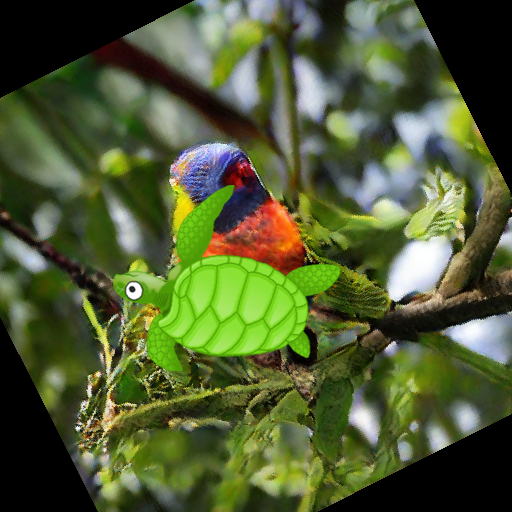

In [17]:
gdown.download("https://drive.google.com/uc?id=1_55KX8AK8pZ936Zv27t8Q-ZY8BJjuBqa", "test.png", quiet=False)
test_image = Image.open('./test.png')
# it is a 3-channel RGB image of size 512x512
print(test_image.mode, test_image.size)
test_image

# Task 1: Predicting segmentation mask

*This is where you need to implement your deep learning solution. Your approach must output a result at the native 512x512 resolution of the test image.*

In [164]:
from torch.utils.data import Dataset, DataLoader
from torchvision import models
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torchvision.transforms.functional import to_pil_image, to_tensor

#### Loading the data into a generic data loader

In [387]:
class CustomDataset(Dataset):
    def __init__(self, data_list):
        self.data_list = data_list

    def __len__(self):
        return len(self.data_list)

    def __getitem__(self, index):
        image, mask = self.data_list[index]
        return image, mask
dataset = CustomDataset(training_set)
data_loader = DataLoader(dataset, batch_size=30, shuffle=True)

#### Creating a unet model using pretrained deeplabv3_resnet50 backbone. And creating specific classes for train, test, visualize.

In [386]:

# U-Net model using torchvision
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()
        self.model = models.segmentation.deeplabv3_resnet50(pretrained=False, num_classes=out_channels)

    def forward(self, x):
        return self.model(x)['out']
def train_model(model, train_loader, criterion, optimizer, num_epochs=5, device='cuda'):
    model.to(device)
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device).long()
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks.squeeze(1))
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        average_loss = total_loss / len(train_loader)
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {average_loss}")

def test_model(model, test_loader, device='cuda'):
    model.eval()
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            predicted_masks = torch.argmax(outputs, dim=1)
            visualize_results(images, masks, predicted_masks)

def visualize_results(images, masks, predicted_masks):
    num_samples = images.size(0)
    for i in range(num_samples):
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(images[i].permute(1, 2, 0).cpu().numpy())
        plt.title('Image')

        plt.subplot(1, 3, 2)
        plt.imshow(masks[i].squeeze().cpu().numpy(), cmap='gray')
        plt.title('Ground Truth Mask')

        plt.subplot(1, 3, 3)
        plt.imshow(predicted_masks[i].cpu().numpy(), cmap='gray')
        plt.title('Predicted Mask')

        plt.show()

In [388]:
criterion = nn.CrossEntropyLoss()
unet_model = UNet(in_channels=3, out_channels=2)  # Assuming 2 classes (foreground and background)
optimizer = optim.Adam(unet_model.parameters(), lr=0.001)

train_model(unet_model, data_loader, criterion, optimizer, num_epochs=300)

torch.save(unet_model.state_dict(), "saved_model.pth")

OutOfMemoryError: ignored

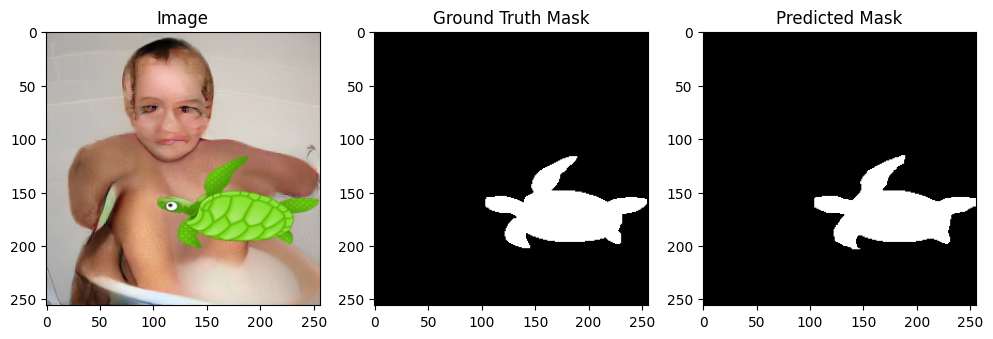

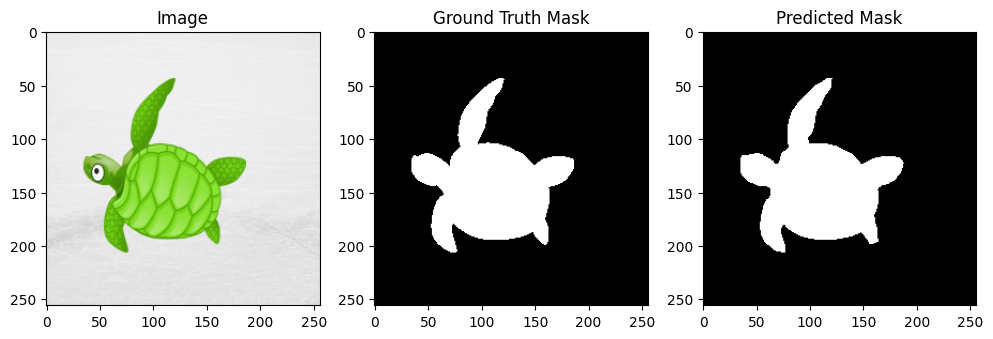

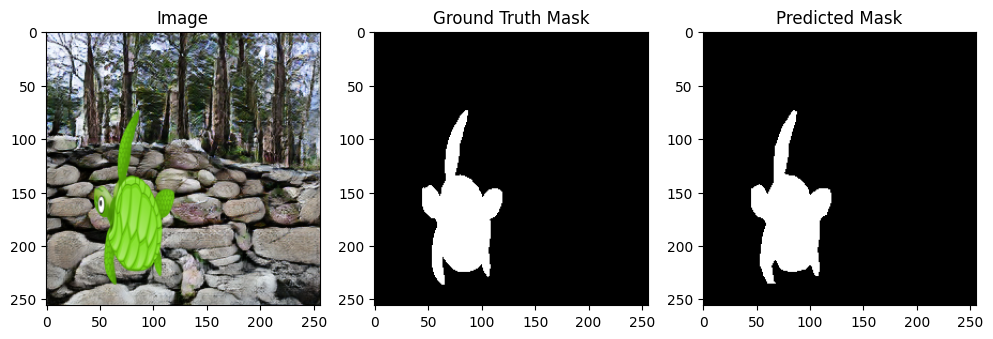

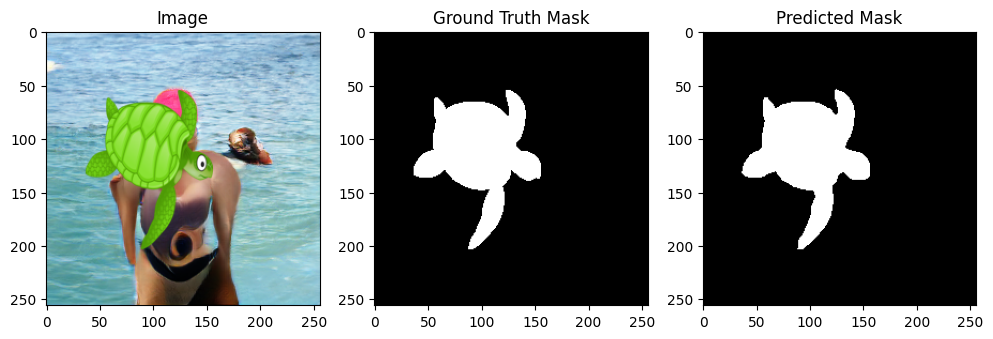

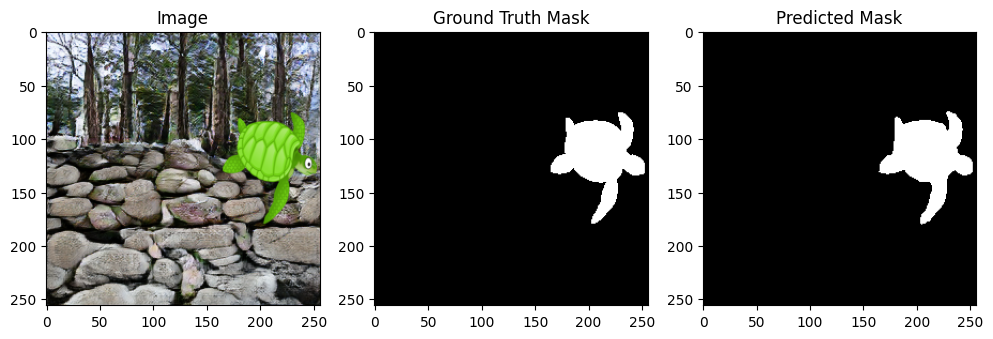

...

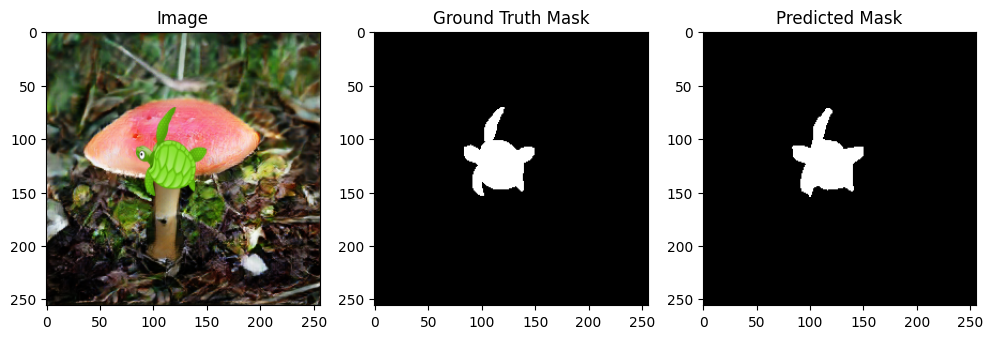

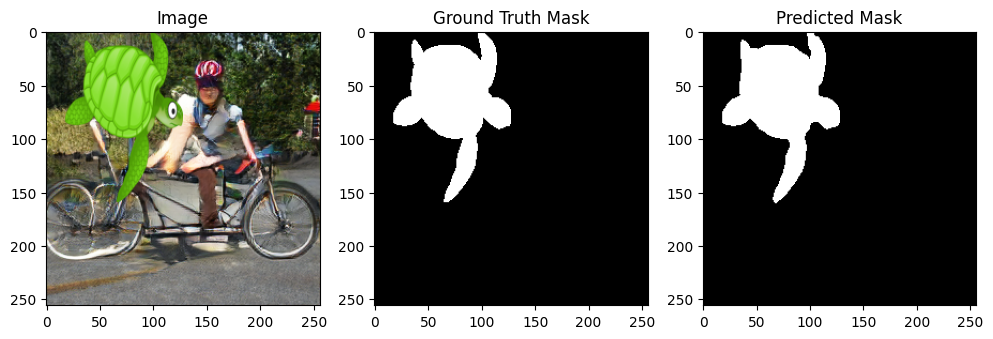

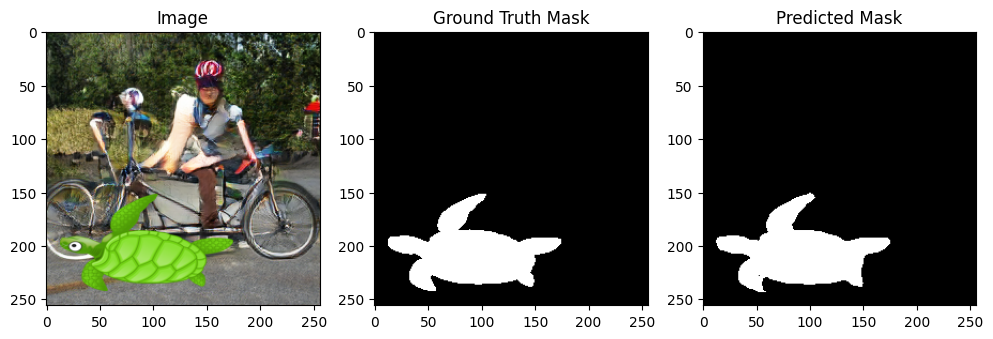

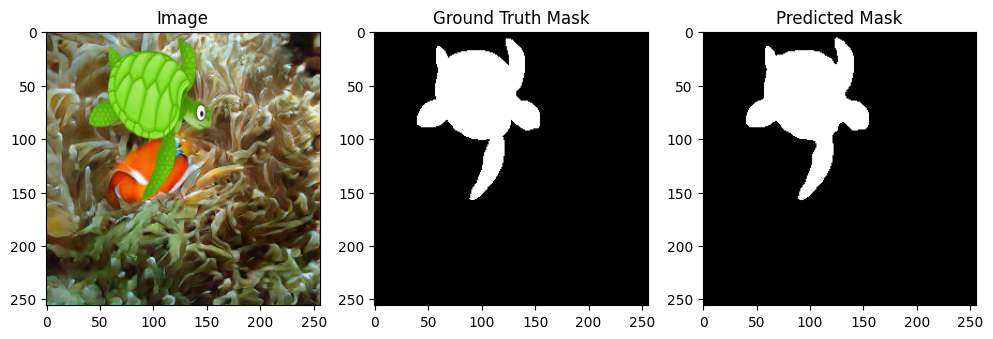

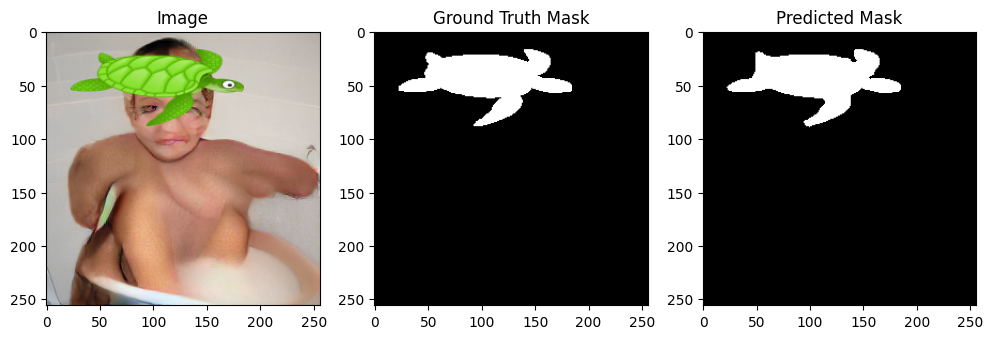

In [284]:
test_model(unet_model, data_loader)

In [285]:
def single_image_mask_generate(model, images, device='cuda'):
    model.eval()
    with torch.no_grad():
      images = images.to(device)
      outputs = model(images)

      predicted_masks = torch.argmax(outputs, dim=1)
      visualize_results_single(images, predicted_masks)
    return predicted_masks


def visualize_results_single(images, predicted_masks):
    num_samples = images.size(0)
    for i in range(1):
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.imshow(images[i].permute(1, 2, 0).cpu().numpy())
        plt.title('Image')



        plt.subplot(1, 3, 3)
        plt.imshow(predicted_masks[i].cpu().numpy(), cmap='gray')
        plt.title('Predicted Mask')

        plt.show()

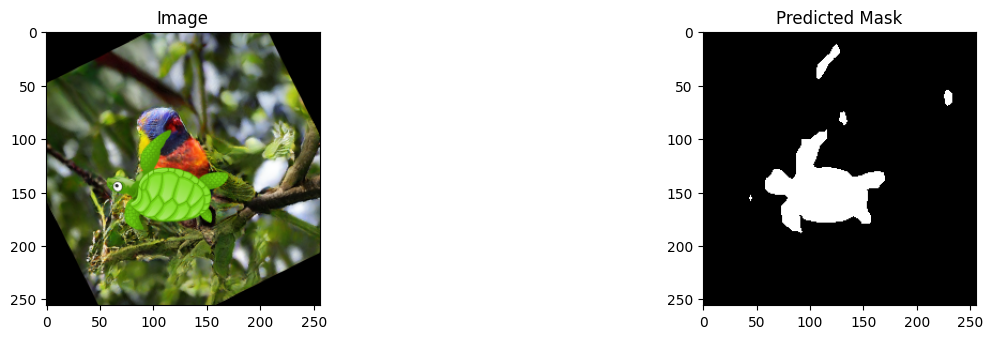

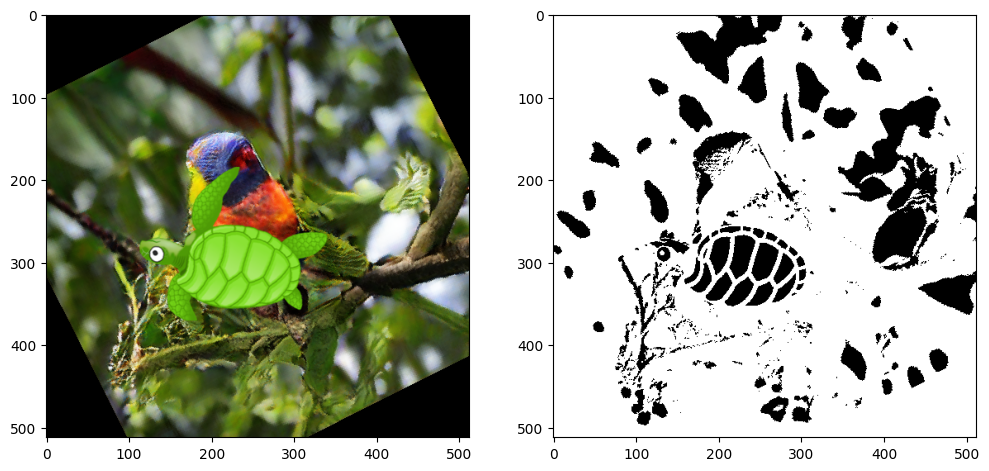

In [355]:
# TODO: Implement and train the deep model

# TODO: Save the model weights and upload them to Google Drive

load_model_weights = False
if load_model_weights:
    # After uploading your saved model weights to Google Drive, share to
    # "Anyone with the link" and extract FILE_ID from the share link
    # See https://support.google.com/drive/answer/2494822?hl=en&co=GENIE.Platform%3DDesktop
    # for more information
    # Now the weights can be downloaded and used via gdown:
    saved_model_url = "https://drive.google.com/uc?id=FILE_ID"
    gdown.download(saved_model_url, "saved_model.pth", quiet=True)
    unet_model = torch.load("model.pth", map_location=torch.device("cpu"))

    # TODO: Load your saved model weights e.g. torch.load("saved_model.pth")

test_image_tensor = tensor_transform(test_image)

def get_mask_from_image(test_image):
  # TODO: Use the deep model that predicts the segmentation mask on the test image
  # The model with the saved weights should be used, if load_model_weights is True
  # Resize the test image to match the expected input size
  resized_image = F.interpolate(test_image_tensor.unsqueeze(0), size=(256, 256), mode='bilinear', align_corners=False)
  res = single_image_mask_generate(unet_model, resized_image)

  test_mask = test_image.mean(0) < 0.5
  return test_mask.byte(), res

test_mask_tensor, res = get_mask_from_image(test_image_tensor)


plt.figure(figsize=(12, 12))
plt.subplot(121)
plt.imshow(test_image_tensor.numpy().transpose(1, 2, 0))
plt.subplot(122)
plt.imshow(test_mask_tensor.numpy(), cmap="gray", vmin=0, vmax=1)

#### The model doesnt give a proper mask

There are other smaller section, we can train it again by rotating the input image and we train more but to make it simpler based on input, dropping small object sizes

In [358]:
temp =res[0].cpu().numpy().astype(np.uint8) * 255

ret, thresh = cv2.threshold(temp, 127, 255, 0)
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [359]:
result_image = temp.copy()
for i in range(len(contours)):
  if len(contours[i]) <= 100:
    cv2.drawContours(result_image, contours, i, (0, 0, 0), -1)

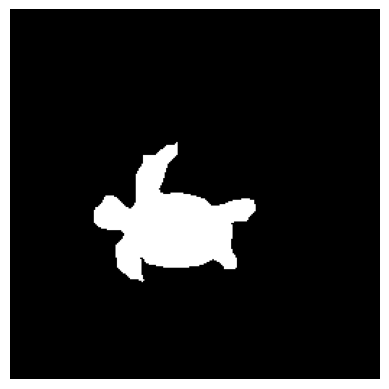

In [360]:
result_image_rgb = cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)

# Display the result using Matplotlib
plt.imshow(result_image_rgb)
plt.axis('off')  # Turn off axis labels
plt.show()

In [361]:
result_image.shape

(256, 256)

# Task 2: Calculating tight enclosing polygon from segmentation mask

*This is where you need to implement your algorithm that predicts a **convex hull** (not concave), an enclosing polygon of foreground pixels. You are not allowed to use cv2, scikit-image or other libraries' functionality that readily solve this task. Treat this problem as point-based (using pixel coordinates) rather than image-based.*

*You don't have to use PyTorch for this part. Your approach must output a result at the native 512x512 resolution of the test image.*

*For the purposes of this assignment, O(n^2) is considered a good time complexity*

In [374]:
def convex_hull(points):
    def orientation(p, q, r):
        val = (q[1] - p[1]) * (r[0] - q[0]) - (q[0] - p[0]) * (r[1] - q[1])
        if val == 0:
            return 0
        return 1 if val > 0 else 2

    def jarvis_march(points):
        n = len(points)
        if n < 3:
            return []

        hull = []

        l = np.argmin(points, axis=0)[0]  # Leftmost point
        p = l  # Start from the leftmost point

        while True:
            hull.append(points[p])
            q = (p + 1) % n
            for r in range(n):
                if orientation(points[p], points[r], points[q]) == 2:
                    q = r
            p = q

            if p == l:
                break

        return hull

    # Filter out the coordinates of the foreground pixels
    foreground_pixels = [(x, y) for x in range(points.shape[0]) for y in range(points.shape[1]) if points[x, y] > 0]

    # Calculate the convex hull of the foreground pixels
    hull = jarvis_march(np.array(foreground_pixels))

    return hull

torch.Size([3, 256, 256])


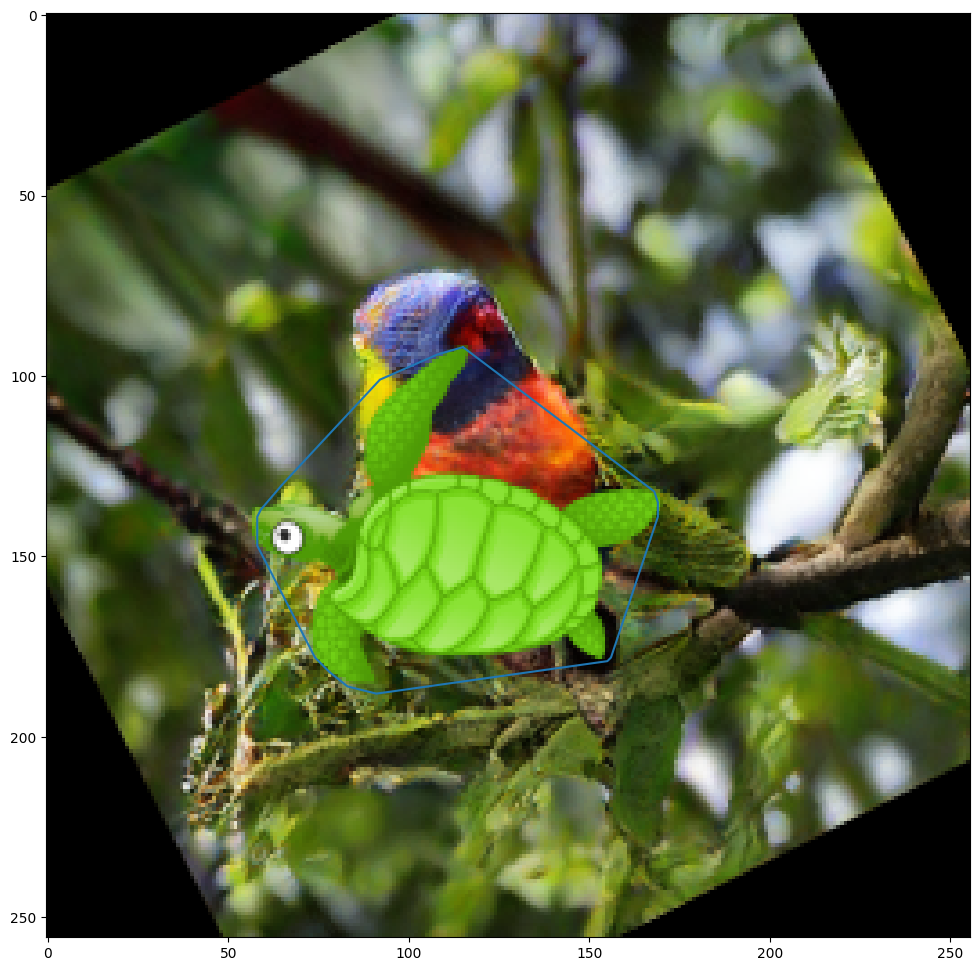

In [378]:
def get_tight_polygon_from_mask(test_mask):
  # TODO: Implement an algorithm that computes the enclosing polygon from the segmentation mask.

  print(test_mask.shape)

  hull_points = convex_hull(result_image)


  return torch.tensor(hull_points)

def visualize_polygon_on_image(test_image, polygon_points_n2):
  # append first point to close the figure
  polygon_points_n2 = torch.cat([polygon_points_n2, polygon_points_n2[:1]], 0)
  ys, xs = torch.split(polygon_points_n2, 1, dim=-1)
  plt.figure(figsize=(12, 12))
  plt.imshow(test_image.numpy().transpose(1, 2, 0))
  plt.plot(xs.numpy(), ys.numpy())


polygon_points_n2_tensor = get_tight_polygon_from_mask(resized_image[0])
visualize_polygon_on_image(resized_image[0], polygon_points_n2_tensor)


In [379]:
def convex_hull_area(hull_points):
    n = len(hull_points)
    if n < 3:
        return 0  # Convex hull must have at least 3 points

    area = 0
    for i in range(n):
        x1, y1 = hull_points[i]
        x2, y2 = hull_points[(i + 1) % n]
        area += (x1 * y2 - x2 * y1)

    return abs(area) / 2.0  # Take the absolute value and divide by 2 to get the area

# Assuming 'hull_points' is a list of coordinates of the convex hull points
# For example: hull_points = [(x1, y1), (x2, y2), ...]

# Calculate the area of the convex hull
hull_area = convex_hull_area(hull_points)

print("Area of the convex hull:", hull_area)

Area of the convex hull: 7381.0


# Task 3: Calculating the area of the polygon

<!-- > Indented block -->


*This is where you need to implement your area calculation algorithm. You are not allowed to use cv2, scikit-image or other libraries' functionality that readily solve this task. Once again, treat this problem as a point-based rather than an image-based one.*

*You don't have to use PyTorch for this part. Your approach must output a result at the native 512x512 resolution of the test image.*

In [ ]:
def calculate_polygon_area(polygon_points_n2):
  # TODO: Implement the algorithm
  area = 0.0
  return area

print("Area = {:.4f}".format(calculate_polygon_area(polygon_points_n2_tensor)))

Area = 0.0000
